### Student Information
Name:陳鈺倫

Student ID:109020020

GitHub ID: ylchen1805

---

### Instructions

1. First: do the **take home** exercises in the [DM2023-Lab1-Master](https://github.com/fjrialdnc0615/DM2023-Lab1-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2023-Lab1-Master](https://github.com/fjrialdnc0615/DM2023-Lab1-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. You need to combine three labeled datasets into one file for your data preparation part.
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/fjrialdnc0615/DM2023-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Thursday)__. 

### First Part

#### Preparation

In [425]:
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [426]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42)

In [427]:
import pandas as pd
# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

# add category to the dataframe
X['category'] = twenty_train.target

# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))


In [428]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np

#### Excercise 1

In [429]:
for i in twenty_train.data[0:3]:
    print(i)

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.

From: ani@ms.uky.edu (Aniruddha B. Deglurkar)
Subject: help: Splitting a trimming region along a mesh 
Organization: University Of Kentucky, Dept. of Math Sciences
Lines: 28



	Hi,

	I have a problem, I hope some of the 'gurus' can help me solve.

	Background of the problem:
	I have a rectangular mesh in the uv

#### Excercise 2

In [430]:
print(X.loc[1:3,'text'])

1    From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
2    From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...
3    From: s0612596@let.rug.nl (M.M. Zwart) Subject...
Name: text, dtype: object


#### Excercise 3

In [431]:
print(X[X.loc[:, 'category_name'] == "sci.med"].iloc[::10][:5])

                                                  text  category category_name
7    From: aldridge@netcom.com (Jacquelin Aldridge)...         2       sci.med
49   From: jimj@contractor.EBay.Sun.COM (Jim Jones)...         2       sci.med
82   From: jason@ab20.larc.nasa.gov (Jason Austin) ...         2       sci.med
118  From: rogers@calamari.hi.com (Andrew Rogers) S...         2       sci.med
142  From: lady@uhunix.uhcc.Hawaii.Edu (Lee Lady) S...         2       sci.med


#### Excercise 4

In [432]:
X.isnull().apply(lambda x: dmh.check_missing_values(x), axis='columns')

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
2252    (The amoung of missing records is: , 0)
2253    (The amoung of missing records is: , 0)
2254    (The amoung of missing records is: , 0)
2255    (The amoung of missing records is: , 0)
2256    (The amoung of missing records is: , 0)
Length: 2257, dtype: object

#### Excercise 5

In [433]:
NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [434]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [435]:
"""
The first row's missing_example is np.nan. This means the value is either empty or not a number to Numpy. Hence it is regarded as 
misssing value in Pandas.
The second one is empty, the definition of null.
The third one and fourth one is a String, so it's not empty.
The fifth one is None without quots, the basic grammar of python, means Null(or Nothing).
The sixth one is '', is a String, which is not equal to None or np.nan. Hence it will not catched by isnull(). 
"""

"\nThe first row's missing_example is np.nan. This means the value is either empty or not a number to Numpy. Hence it is regarded as \nmisssing value in Pandas.\nThe second one is empty, the definition of null.\nThe third one and fourth one is a String, so it's not empty.\nThe fifth one is None without quots, the basic grammar of python, means Null(or Nothing).\nThe sixth one is '', is a String, which is not equal to None or np.nan. Hence it will not catched by isnull(). \n"

#### Excercise 6

In [436]:
X_sample = X.sample(n=1000,random_state=42)
'''
The index(Name) is not ordered. 
But the content is the same with original data at the index(Name).
Since the n is quit large, the distribution is similar to X.
'''

'\nThe index(Name) is not ordered. \nBut the content is the same with original data at the index(Name).\nSince the n is quit large, the distribution is similar to X.\n'

#### Excercise 7

327
277
sci.med                   277
soc.religion.christian    270
comp.graphics             247
alt.atheism               206
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

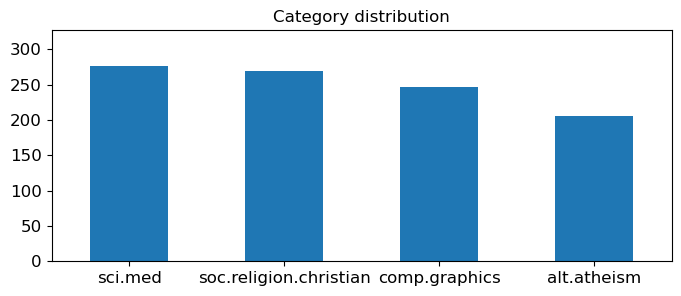

In [437]:
X_sample = X.sample(n=1000,random_state=42)
print(max(X_sample.category_name.value_counts()) + 50)
# plot barchart for X_sample
print(max(X_sample.category_name.value_counts()))
upper_bound = max(X_sample.category_name.value_counts() + 50) #277 + 50
print(X_sample.category_name.value_counts())

X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, upper_bound], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

#### Excercise 8

<AxesSubplot:>

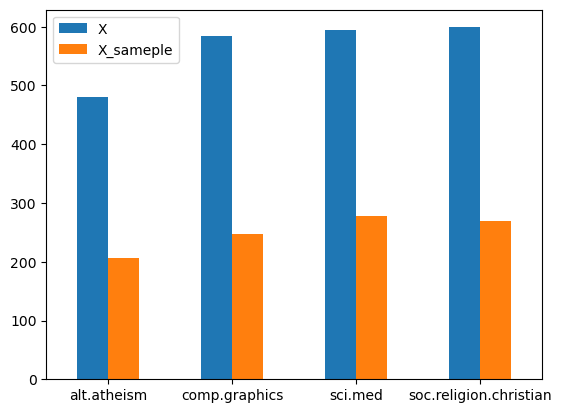

In [438]:
X_sample = X.sample(n=1000,random_state=42)

# Use two column for X and A_sample
pd.DataFrame({'X' : X.category_name.value_counts(),
              'X_sameple' : X_sample.category_name.value_counts()}
            ).plot(kind='bar', rot=0)

#### Prepare data for below excercise

In [439]:
import nltk
nltk.download('punkt')

X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))

from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix


[nltk_data] Downloading package punkt to /Users/ylchen/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#### Excercise 9

In [440]:
analyze = count_vect.build_analyzer()
analyze(X.text[0])

['from',
 'sd345',
 'city',
 'ac',
 'uk',
 'michael',
 'collier',
 'subject',
 'converting',
 'images',
 'to',
 'hp',
 'laserjet',
 'iii',
 'nntp',
 'posting',
 'host',
 'hampton',
 'organization',
 'the',
 'city',
 'university',
 'lines',
 '14',
 'does',
 'anyone',
 'know',
 'of',
 'good',
 'way',
 'standard',
 'pc',
 'application',
 'pd',
 'utility',
 'to',
 'convert',
 'tif',
 'img',
 'tga',
 'files',
 'into',
 'laserjet',
 'iii',
 'format',
 'we',
 'would',
 'also',
 'like',
 'to',
 'do',
 'the',
 'same',
 'converting',
 'to',
 'hpgl',
 'hp',
 'plotter',
 'files',
 'please',
 'email',
 'any',
 'response',
 'is',
 'this',
 'the',
 'correct',
 'group',
 'thanks',
 'in',
 'advance',
 'michael',
 'michael',
 'collier',
 'programmer',
 'the',
 'computer',
 'unit',
 'email',
 'collier',
 'uk',
 'ac',
 'city',
 'the',
 'city',
 'university',
 'tel',
 '071',
 '477',
 '8000',
 'x3769',
 'london',
 'fax',
 '071',
 '477',
 '8565',
 'ec1v',
 '0hb']

#### Excercise 10

In [441]:
count_vect.get_feature_names_out()[ np.where( X_counts[0:5, 0:100].toarray()[4] == 1)]

array(['00', '01'], dtype=object)

#### Excercise 11

Columns : [134  92   1 ...   1   1   1] , Max : 29825 , min : 1
Rows : [  98  167  554 ...  523 2814   98] , Max : 9374 , min : 15
Column's order :  [32142 23610 32493 ... 18632 18634 17893]
Columns : [29825 17660 17222 ...     1     1     1] , Max : 29825 , min : 1
Row order :  [ 433 1890 1403 ...  906 1743 1407]
Rows : [9374 8845 8470 ...   24   20   15] , Max : 9374 , min : 15


,term_the,term_of,term_to,term_and,term_is,term_in,term_that,term_it,term_you,term_for,term_not,term_this,term_be,term_from,term_are,term_edu,term_have,term_as,term_on,term_with
doc_433,362,190,227,150,200,108,85,123,190,117,58,91,64,72,76,25,55,70,65,80
doc_1890,242,89,157,185,77,100,25,47,45,133,15,37,17,58,35,113,12,19,51,43
doc_1403,589,326,281,208,174,135,120,111,49,60,98,90,58,47,46,0,53,57,51,50
doc_400,249,165,135,207,114,109,39,76,52,157,16,25,35,63,42,45,24,37,76,44
doc_768,200,164,103,254,90,69,38,87,19,105,8,13,36,39,29,30,13,33,44,56
doc_971,175,155,179,73,126,82,130,92,29,48,66,18,54,12,67,0,41,61,25,18
doc_1401,217,204,80,151,28,146,29,5,0,92,11,27,18,28,34,0,9,17,13,43
doc_1596,265,162,112,73,141,98,115,71,28,30,50,35,48,30,30,0,35,39,31,18
doc_1705,158,177,48,118,21,68,19,7,11,41,14,22,9,27,14,2,10,22,20,32
doc_1103,200,122,126,112,55,76,61,56,28,36,46,43,35,14,35,1,47,31,21,25


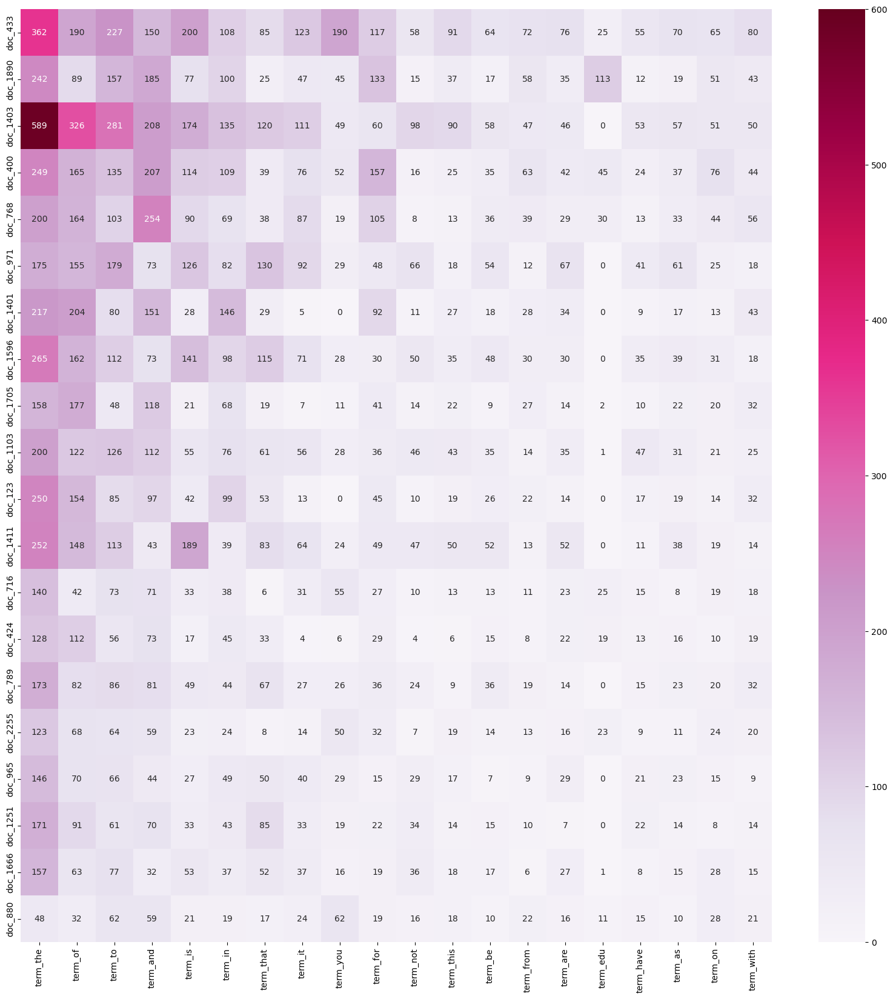

In [442]:
# idea:
# Get top 10(or 20) frequently using words 
# and Top 10(or 20) rows with most words to plot.
temp = X_counts.copy().toarray()

# Sort rows and columns in decending order
print("Columns :",temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)
print("Rows :",temp.sum(axis=1), ", Max :", max(temp.sum(axis=1)),
                    ", min :", min(temp.sum(axis=1)),)
# Sort columns by the number of occurrence, also the cloumn names.
col_order = temp.sum(axis=0).argsort()[::-1]
print("Column's order : ", col_order)
temp = temp[:, col_order]
print("Columns :",temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)
# Sort rows by the number of words in each row, also the index.
row_order = temp.sum(axis=1).argsort()[::-1]
print("Row order : ", row_order)
temp = temp[row_order, :]
print("Rows :",temp.sum(axis=1), ", Max :", max(temp.sum(axis=1)),
                    ", min :", min(temp.sum(axis=1)),)
# index
my_plot_y = [["doc_"+ str(i) for i in list(X.index)][j] for j in row_order[:20]]
# columns
my_plot_x = [["term_"+str(i) for i in count_vect.get_feature_names_out()][j] for j in col_order[:20]]
# data
my_plot_z = temp[0:20, 0:20]

import seaborn as sns
# plot
df_todraw = pd.DataFrame(my_plot_z, columns = my_plot_x, index = my_plot_y)
display(df_todraw)
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 fmt='g',
                 vmin=0, vmax=600, annot=True)

#### Excercise12

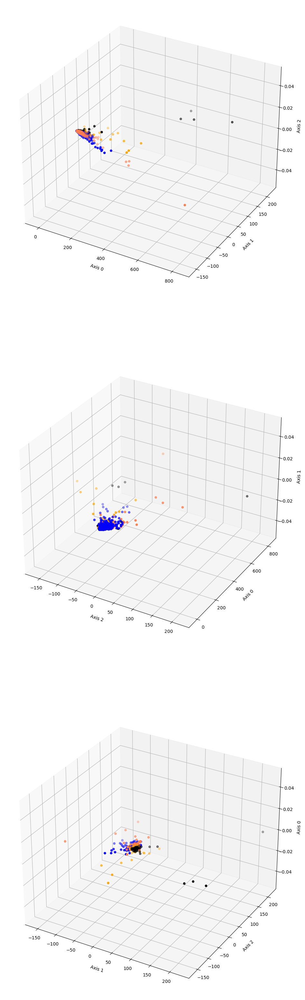

"\nIn first plot and second plot, \nthe axis 2 is decreasing while axis 1 and axis 2 is increasing.\nIn first plot,\nthere's three black dots(comp.graphics) that is far from others,\nwhich also appears in third plot.\nIn al plots,\nthere's a coral dot(alt.atheism) that is far from other dots.\n"

In [443]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

col = ['coral', 'blue', 'black', 'orange']
my_X = PCA(n_components = 3).fit_transform(X_counts.toarray())

fig = plt.figure(figsize = (75,40))

# Angle1
ax = fig.add_subplot(3, 1, 1, projection='3d')

for c, category in zip(col, categories):
    xs = my_X[X['category_name'] == category].T[0]
    ys = my_X[X['category_name'] == category].T[1]
    zs = my_X[X['category_name'] == category].T[2]
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nAxis 0')
ax.set_ylabel('\nAxis 1')
ax.set_zlabel('\nAxis 2')

# Angle2
ax = fig.add_subplot(3, 1, 2, projection='3d')
for c, category in zip(col, categories):
    xs = my_X[X['category_name'] == category].T[2]
    ys = my_X[X['category_name'] == category].T[0]
    zs = my_X[X['category_name'] == category].T[1]
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nAxis 2')
ax.set_ylabel('\nAxis 0')
ax.set_zlabel('\nAxis 1')

# Angle3
ax = fig.add_subplot(3, 1, 3, projection='3d')
for c, category in zip(col, categories):
    xs = my_X[X['category_name'] == category].T[1]
    ys = my_X[X['category_name'] == category].T[2]
    zs = my_X[X['category_name'] == category].T[0]
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nAxis 1')
ax.set_ylabel('\nAxis 2')
ax.set_zlabel('\nAxis 0')
plt.show()

'''
In first plot and second plot, 
the axis 2 is decreasing while axis 1 and axis 2 is increasing.
In first plot,
there's three black dots(comp.graphics) that is far from others,
which also appears in third plot.
In al plots,
there's a coral dot(alt.atheism) that is far from other dots.
'''


#### Excercise 13

In [444]:
import plotly.express as px
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
df_todraw = pd.DataFrame(term_frequencies[:300],index=count_vect.get_feature_names_out()[:300], columns=['term_frequencies'])
# display(df_todraw)
fig = px.bar(df_todraw,)
fig.update_xaxes(tickangle=-90)
fig.show()

#### Excercise 14

In [445]:
# idea:
# Get top 10(or 20) frequently using words to plot.
temp = X_counts.copy().toarray()

# Sort columns in decending order
print("Columns :",temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)
# Sort columns by the number of occurrence, also the cloumn names.
col_order = temp.sum(axis=0).argsort()[::-1]
print("Column's order : ", col_order)
temp = temp[:, col_order]
print(temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)

# data
data = temp.sum(axis=0)
# columns
my_plot_x = [["term_"+str(i) for i in count_vect.get_feature_names_out()][j] for j in col_order[:300]]

Columns : [134  92   1 ...   1   1   1] , Max : 29825 , min : 1
Column's order :  [32142 23610 32493 ... 18632 18634 17893]
[29825 17660 17222 ...     1     1     1] , Max : 29825 , min : 1


In [446]:
import plotly.express as px
# print(data.shape)
df_todraw = pd.DataFrame(data[:300],index=my_plot_x, columns=['term_frequencies'])
# display(df_todraw)
fig = px.bar(df_todraw,)
fig.update_xaxes(tickangle=-90)
fig.show()

#### Excercise 15

In [447]:
# idea:
# Get top 10(or 20) frequently using words to plot.
temp = X_counts.copy().toarray()

# Sort columns in decending order
print("Columns :",temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)
# Sort columns by the number of occurrence, also the cloumn names.
col_order = temp.sum(axis=0).argsort()[::-1]
print("Column's order : ", col_order)
temp = temp[:, col_order]
print(temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)

# data
data = temp.sum(axis=0)
# columns
my_plot_x = [["term_"+str(i) for i in count_vect.get_feature_names_out()][j] for j in col_order[:300]]
# display(df_todraw)

import plotly.express as px
#plot
df_todraw = pd.DataFrame(data[:300],index=my_plot_x, columns=['term_frequencies'])
fig = px.histogram(df_todraw,y='term_frequencies',x=my_plot_x)
fig.update_xaxes(tickangle=-90)
fig.show()

Columns : [134  92   1 ...   1   1   1] , Max : 29825 , min : 1
Column's order :  [32142 23610 32493 ... 18632 18634 17893]
[29825 17660 17222 ...     1     1     1] , Max : 29825 , min : 1


#### Excercise 16

In [448]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

# This won't work
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category)
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()
display(X)

# Below one work
my_mlb = preprocessing.LabelBinarizer()
my_mlb.fit(X.category_name) # need to use the desired labels to fit the LabelBinarizer
X['bin_category_name'] = my_mlb.transform(X['category_name']).tolist()
display(X)

'''
The transform works when the input is in the one it fit, otherwise it will ouput 0 vector.
'''

,text,category,category_name,unigrams,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","[0, 0, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","[0, 0, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","[0, 0, 0, 0]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","[0, 0, 0, 0]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","[0, 0, 0, 0]"
...,...,...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med,"[From, :, roos, @, Operoni.Helsinki.FI, (, Chr...","[0, 0, 0, 0]"
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med,"[From, :, mhollowa, @, ic.sunysb.edu, (, Micha...","[0, 0, 0, 0]"
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med,"[From, :, sasghm, @, theseus.unx.sas.com, (, G...","[0, 0, 0, 0]"
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med,"[From, :, Dan, Wallach, <, dwallach, @, cs.ber...","[0, 0, 0, 0]"


,text,category,category_name,unigrams,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","[0, 0, 0, 1]"
...,...,...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med,"[From, :, roos, @, Operoni.Helsinki.FI, (, Chr...","[0, 0, 1, 0]"
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med,"[From, :, mhollowa, @, ic.sunysb.edu, (, Micha...","[0, 0, 1, 0]"
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med,"[From, :, sasghm, @, theseus.unx.sas.com, (, G...","[0, 0, 1, 0]"
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med,"[From, :, Dan, Wallach, <, dwallach, @, cs.ber...","[0, 0, 1, 0]"


'\nThe transform works when the input is in the one it fit, otherwise it will ouput 0 vector.\n'

### Second Part

#### Preparation

In [449]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
%matplotlib inline
import os
import numpy as np
import pandas as pd
import nltk
nltk.download('punkt')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[nltk_data] Downloading package punkt to /Users/ylchen/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

#### Load data

In [450]:
current_dir = os.getcwd()
file_list = [
    os.path.join(current_dir,"sentiment labelled sentences","amazon_cells_labelled.txt"),
    os.path.join(current_dir,"sentiment labelled sentences","imdb_labelled.txt"),
    os.path.join(current_dir,"sentiment labelled sentences","yelp_labelled.txt")
]

ls = []
# Read files and store text and concat all data.
for file in file_list:
    with open(file) as f:
        ls = ls + f.readlines()

# Process data
data = []
for i in ls:
    temp = i.split('\t')
    data.append([temp[0], int(temp[1])])


In [451]:
# --- Work not good --- 
# Lose some data

# file_list = [
#     "sentiment labelled sentences/amazon_cells_labelled.txt",
#     "sentiment labelled sentences/imdb_labelled.txt",
#     "sentiment labelled sentences/yelp_labelled.txt"
# ]
# data1 = pd.read_csv("sentiment labelled sentences/amazon_cells_labelled.txt", sep='\t', header=None)
# data2 = pd.read_csv("sentiment labelled sentences/imdb_labelled.txt", sep='\t', header=None)
# data3 = pd.read_csv("sentiment labelled sentences/yelp_labelled.txt", sep='\t', header=None)
# print(data1.shape,data2.shape, data3.shape)
# data = pd.concat([pd.read_csv(file, sep='\t', header=None) for file in file_list])
# data.columns = ["sentence", "score"]
# data

#### Convert to Pandas dataframe

In [452]:
data = pd.DataFrame(data)
data.columns = ['sentence', 'score'] # name the columns
display(data)

,sentence,score
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
...,...,...
2995,I think food should have flavor and texture an...,0
2996,Appetite instantly gone.,0
2997,Overall I was not impressed and would not go b...,0
2998,"The whole experience was underwhelming, and I ...",0


#### Dealing with Missing Values

In [453]:
data.dropna(inplace=True)

In [454]:
data.isnull().apply(lambda x : dmh.check_missing_values(x))

,sentence,score
0,The amoung of missing records is:,The amoung of missing records is:
1,0,0


In [455]:
data.isnull().apply(lambda x : dmh.check_missing_values(x), axis=1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
2995    (The amoung of missing records is: , 0)
2996    (The amoung of missing records is: , 0)
2997    (The amoung of missing records is: , 0)
2998    (The amoung of missing records is: , 0)
2999    (The amoung of missing records is: , 0)
Length: 3000, dtype: object

#### Dealing with Duplicated Data

In [456]:
sum(data.duplicated())

17

In [457]:
data.drop_duplicates(inplace=True)
sum(data.duplicated())

0

#### Feature Creation

In [458]:
data['unigrams'] = data['sentence'].apply(lambda x: dmh.tokenize_text(x))
display(data)

,sentence,score,unigrams
0,So there is no way for me to plug it in here i...,0,"[So, there, is, no, way, for, me, to, plug, it..."
1,"Good case, Excellent value.",1,"[Good, case, ,, Excellent, value, .]"
2,Great for the jawbone.,1,"[Great, for, the, jawbone, .]"
3,Tied to charger for conversations lasting more...,0,"[Tied, to, charger, for, conversations, lastin..."
4,The mic is great.,1,"[The, mic, is, great, .]"
...,...,...,...
2995,I think food should have flavor and texture an...,0,"[I, think, food, should, have, flavor, and, te..."
2996,Appetite instantly gone.,0,"[Appetite, instantly, gone, .]"
2997,Overall I was not impressed and would not go b...,0,"[Overall, I, was, not, impressed, and, would, ..."
2998,"The whole experience was underwhelming, and I ...",0,"[The, whole, experience, was, underwhelming, ,..."


#### Feature subset selection

In [459]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
data_counts = count_vect.fit_transform(data.sentence)
print(count_vect.get_feature_names_out())

['00' '10' '100' ... 'zillion' 'zombie' 'zombiez']


#### Dimensionality Reduction

In [460]:
from sklearn.decomposition import PCA

In [461]:
print(data_counts.shape)
data_counts = PCA(n_components = 2).fit_transform(X_counts.toarray())
print(data_counts.shape)

(2983, 5155)
(2257, 2)


### Third Part

#### Visualization

##### Generate heap map.

Columns : [ 1 36  3 ...  1  2  1] , Max : 1951 , min : 1
Rows : [19  4  4 ...  9 16 27] , Max : 71 , min : 1
Column's order :  [4531  216 2432 ... 2933 2929    0]
Columns : [1951 1138  789 ...    1    1    1] , Max : 1951 , min : 1
Row order :  [1608 1410 1288 ...  483  869  745]
Rows : [71 67 58 ...  1  1  1] , Max : 71 , min : 1


,term_the,term_and,term_it,term_is,term_to,term_this,term_of,term_was,term_in,term_for,term_that,term_not,term_with,term_my,term_very,term_good,term_on,term_you,term_great,term_but
doc_1608,4,8,0,1,1,2,4,0,1,0,1,0,1,0,0,0,0,0,0,0
doc_1410,4,5,0,4,0,3,0,0,0,0,0,0,0,0,0,0,3,0,0,0
doc_1288,8,3,2,1,1,1,2,0,0,1,0,0,2,0,0,0,1,0,0,0
doc_1379,6,1,1,1,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0
doc_1417,2,2,0,2,0,0,1,0,1,1,3,0,0,0,0,0,1,0,0,1
doc_1790,2,4,0,1,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0
doc_1791,2,2,1,1,3,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0
doc_1609,3,1,1,2,1,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0
doc_1771,7,2,0,2,0,1,1,1,1,0,2,0,0,0,0,0,0,0,0,1
doc_1300,0,3,2,0,3,2,2,0,1,0,0,0,0,0,0,0,0,1,0,0


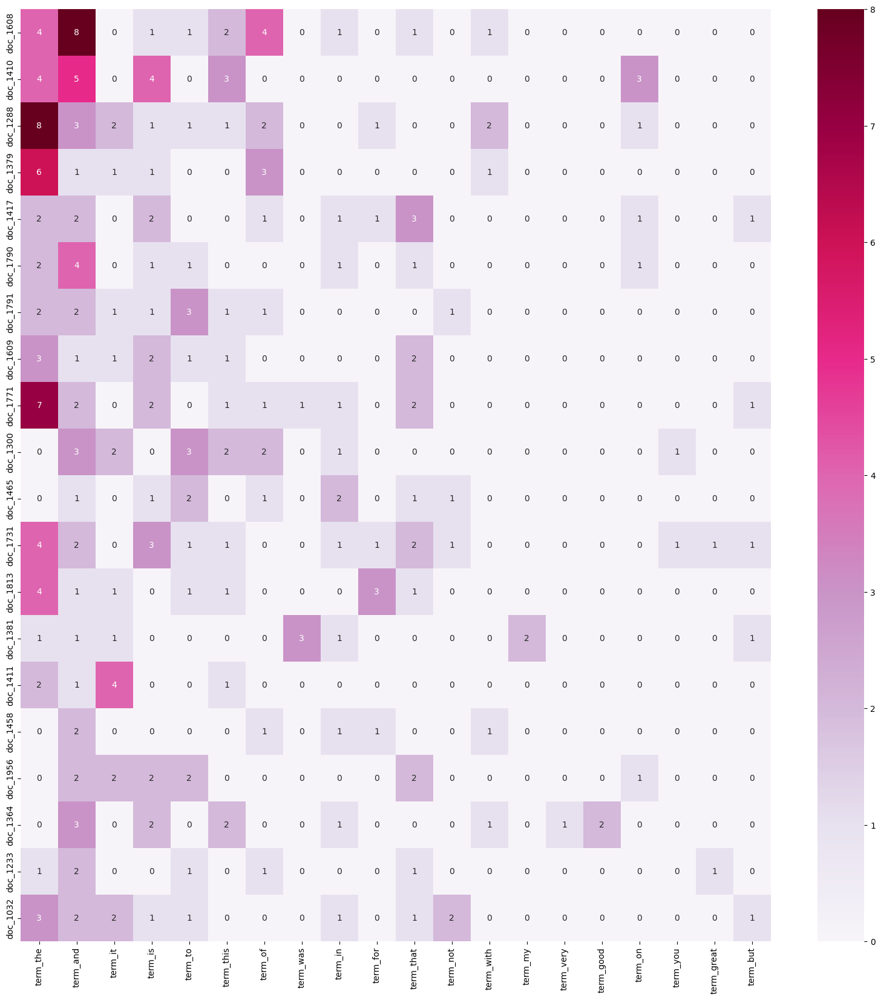

In [462]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
data_counts = count_vect.fit_transform(data.sentence)

temp = data_counts.copy().toarray()

# Sort rows and columns in decending order
print("Columns :",temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)
print("Rows :",temp.sum(axis=1), ", Max :", max(temp.sum(axis=1)),
                    ", min :", min(temp.sum(axis=1)),)
# Sort columns by the number of occurrence, also the cloumn names.
col_order = temp.sum(axis=0).argsort()[::-1]
print("Column's order : ", col_order)
temp = temp[:, col_order]
print("Columns :",temp.sum(axis=0),", Max :", max(temp.sum(axis=0)),
                    ", min :", min(temp.sum(axis=0)),)
# Sort rows by the number of words in each row, also the index.
row_order = temp.sum(axis=1).argsort()[::-1]
print("Row order : ", row_order)
temp = temp[row_order, :]
print("Rows :",temp.sum(axis=1), ", Max :", max(temp.sum(axis=1)),
                    ", min :", min(temp.sum(axis=1)),)
# index
my_plot_y = [["doc_"+ str(i) for i in list(X.index)][j] for j in row_order[:20]]
# columns
my_plot_x = [["term_"+str(i) for i in count_vect.get_feature_names_out()][j] for j in col_order[:20]]
# data
my_plot_z = temp[0:20, 0:20]

import seaborn as sns
# plot
df_todraw = pd.DataFrame(my_plot_z, columns = my_plot_x, index = my_plot_y)
display(df_todraw)
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 fmt='g',
                 vmin=0, vmax=8, annot=True)

##### Generate bar plot.

In [463]:
import plotly.express as px
# print(data.shape)
df_todraw = pd.DataFrame(temp.sum(axis=0)[:20],index=my_plot_x, columns=['term_frequencies'])
# display(df_todraw)
fig = px.bar(df_todraw,)
fig.update_xaxes(tickangle=-90)
fig.show()

##### WordCloud

I also use package WordCloud here to visuallize the text by frequency.

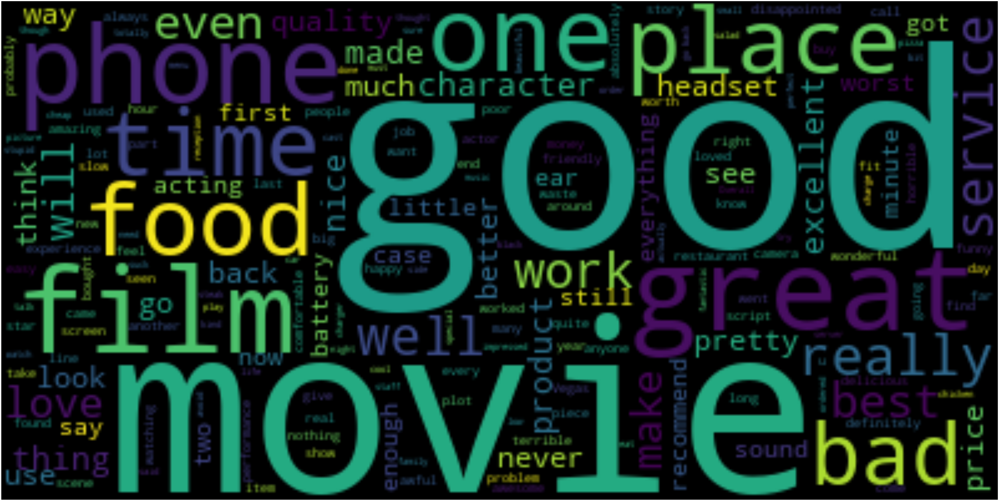

In [464]:
from wordcloud import WordCloud

wordcloud = WordCloud().generate(" ".join(data.sentence))
plt.figure(figsize=(100,100))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

#### TF-IDF

In [465]:
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDF
# Remove the adding 1 from the document frequencies
# by set smooth_idf to False
tfidf_vectorizer = TfidfVectorizer(smooth_idf=False) 
tfidf = tfidf_vectorizer.fit_transform(data.sentence)
result = pd.DataFrame(tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
print("Document Matrix:")
display(result)
print("TF-IDF(spar-matrix):",tfidf, sep='\n')

Document Matrix:


,00,10,100,11,12,13,15,15g,15pm,17,...,yucky,yukon,yum,yummy,yun,z500a,zero,zillion,zombie,zombiez
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2978,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2979,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2981,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


TF-IDF(spar-matrix):
  (0, 1013)	0.42375353705493357
  (0, 647)	0.21986198714249
  (0, 1982)	0.22795272200988123
  (0, 4793)	0.3321398067449972
  (0, 4835)	0.27220839923661655
  (0, 4531)	0.08503841306601063
  (0, 2158)	0.21924655165802928
  (0, 2314)	0.29018232243850295
  (0, 2432)	0.11753071228690429
  (0, 3387)	0.306763773797075
  (0, 4609)	0.12516554647907746
  (0, 2809)	0.2250985060760525
  (0, 1829)	0.1536748863937761
  (0, 4987)	0.24559334361961488
  (0, 3043)	0.21986198714249
  (0, 2427)	0.1185279084435055
  (0, 4545)	0.20419815229464136
  (0, 4161)	0.18422876824272702
  (1, 4861)	0.6385674457309276
  (1, 1603)	0.4694898937158242
  (1, 713)	0.510665215141366
  (1, 1993)	0.33321448797434533
  (2, 2449)	0.8317724570849672
  (2, 2023)	0.3923762913157625
  (2, 4531)	0.19012572745572914
  :	:
  (2982, 1387)	0.30753756154740747
  (2982, 5110)	0.30753756154740747
  (2982, 3437)	0.30753756154740747
  (2982, 3857)	0.26999991275380825
  (2982, 2068)	0.28385394204440995
  (2982, 588)	0.24

#### Naive Bayes classifier

In [466]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

# TF-IDF
X_train, X_test, Y_train, Y_test = train_test_split(tfidf.toarray(), data.score, test_size=0.2, random_state=42)
model = MultinomialNB()
model.fit(X_train, Y_train)
model.score(X_test, Y_test)

0.8274706867671692

In [467]:
# Frequency
X_train, X_test, Y_train, Y_test = train_test_split(data_counts.toarray(), data.score, test_size=0.2, random_state=42)
model = MultinomialNB()
model.fit(X_train, Y_train)
model.score(X_test, Y_test)

0.8241206030150754

##### Use Cross Validation to get avarage score

In [468]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score

# TF-IDF
model = MultinomialNB()
cross_val_score(model,tfidf.toarray(), data.score,cv=5).mean()

0.8095887715984846

In [469]:
# Frequency
model = MultinomialNB()
cross_val_score(model,data_counts.toarray(), data.score,cv=5).mean()

0.8102576641597248

### Fourth Part

* **Missing Value**  
  we just easily drop those data. There's another way is using mean, mode or the most possible value to fill the missing value.
* **Words with Similar Meaning but in Different Forms**  
  When we tokenize the text, the words with different forms(ex. suffix...) with the same meaning will be recognized as different elements. Look the example below:
  ```python
  ex_vect = CountVectorizer()  
  ex_vect.fit_transform(dmh.tokenize_text("Cat Cats running run"))
  ex_vect.get_feature_names_out()
  ```
  The ouput will be:  
  ```python
  array(['cat', 'cats', 'run', 'running'], dtype=object)
  ```

  
* **Parameters Tunning**  
  When we use CountVectorizer, we only use default parameters. 
   
  But there are some parameters we can try:
  * `ngram_range` capture phrases, default=(1, 1).
  * `max_df`, `min_df` filter, ignore terms that appears too **frequent** and too **rare**.
  * `norm` use **l1** or **l2** loss, default='l2'.